<a href="https://www.kaggle.com/code/nomanjaffar11/brain-tumor-segmentation-using-u-net?scriptVersionId=208173016" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Explore The DATA

In [2]:
import nibabel as nib

import numpy as np

In [3]:
TRAINING_DATASET_PATH = '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData'
VALIDATION_DATASET_PATH = '/kaggle/input/brats20-dataset-training-validation/BraTS2020_ValidationData/MICCAI_BraTS2020_ValidationData'

### Handling 3D MRI Images in NIfTI Format

The code demonstrates how to load and access a 3D MRI image in NIfTI format using the `nibabel` library. 

The NIfTI file is loaded into a **NumPy memmap object**, which allows efficient memory management by accessing large datasets directly from the disk. 

#### Image Shape:
- The image shape `(240, 240, 155)` indicates that the MRI data is a 3D volume with:
  - **240** pixels (width) 
  - **240** pixels (height)
  - **155** slices (depth) 
This data represents a 3D image where each voxel (volumetric pixel) contributes to the MRI's spatial resolution.

#### Accessing Slices:
- To extract and visualize a specific 2D slice from the 3D image (e.g., the 50th slice), you can use array indexing: `img[:, :, 50]`.

#### Memory Efficiency:
- The image is stored as a **NumPy memmap** (`<class 'numpy.memmap'>`), a memory-efficient way to handle large datasets by accessing parts of the array from disk without loading the entire dataset into memory.


In [4]:
path = '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_flair.nii'

In [5]:
img = nib.load(path).get_fdata()
img.shape

(240, 240, 155)

In [6]:
print(f"The .nii files are stored in memory as numpy's: {type(img)}.")

The .nii files are stored in memory as numpy's: <class 'numpy.memmap'>.


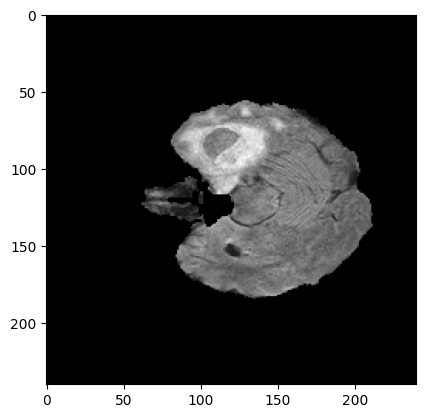

In [7]:
slice_50 = img[:, :,50]

import matplotlib.pyplot as plt
plt.imshow(slice_50, cmap='gray')
plt.show()

In [8]:
# Display the matrix of the selected slice
print("Matrix of the 50th slice:")
print(slice_50)
print()
print(slice_50.shape)

# Find the unique values in the matrix of the slice
unique_values = np.unique(slice_50)

# Display the unique values
print("Unique values in the 50th slice matrix:")
print(unique_values)

Matrix of the 50th slice:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

(240, 240)
Unique values in the 50th slice matrix:
[  0.  26.  28.  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.
  40.  41.  42.  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.
  54.  55.  56.  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.
  68.  69.  70.  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.
  82.  83.  84.  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.
  96.  97.  98.  99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109.
 110. 111. 112. 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123.
 124. 125. 126. 127. 128. 129. 130. 131. 132. 133. 134. 135. 136. 137.
 138. 139. 140. 141. 142. 143. 144. 145. 146. 147. 148. 149. 150. 151.
 152. 153. 154. 155. 156. 157. 158. 159. 160. 161. 162. 163. 164. 165.
 166. 167. 168. 169. 170. 171. 172. 173. 174. 175. 176. 

In [9]:
plt.style.use('default')
fig, axes = plt.subplots(13,10, figsize=(120,120))
for i, ax in enumerate(axes.reshape(-1)):
    ax.imshow(img[:,:,1 + i])
plt.show()

In [10]:
from sklearn.preprocessing import MinMaxScaler
# Load and scale the data
img = nib.load(path).get_fdata()
img_flat = img.flatten().reshape(-1, 1)  # Flatten the image to 1D

scaler = MinMaxScaler(feature_range=(0, 1))  # Scale between 0 and 1
img_scaled_flat = scaler.fit_transform(img_flat)

# Reshape back to the original shape
img_scaled = img_scaled_flat.reshape(img.shape)

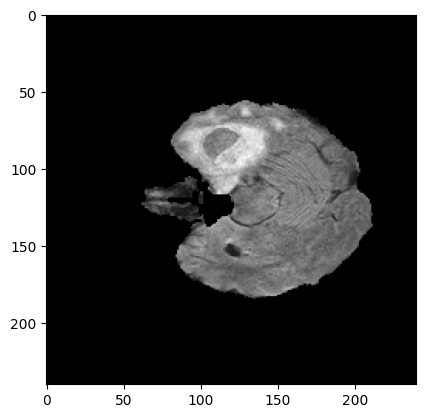

In [11]:
slice_50 = img_scaled[:, :,50]

import matplotlib.pyplot as plt
plt.imshow(slice_50, cmap='gray')
plt.show()

In [12]:
# Display the matrix of the selected slice
print("Matrix of the 50th slice:")
print(slice_50)
print()
print(slice_50.shape)

# Find the unique values in the matrix of the slice
unique_values = np.unique(slice_50)

# Display the unique values
print("Unique values in the 50th slice matrix:")
print(unique_values)

Matrix of the 50th slice:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

(240, 240)
Unique values in the 50th slice matrix:
[0.     0.0416 0.0448 0.0464 0.048  0.0496 0.0512 0.0528 0.0544 0.056
 0.0576 0.0592 0.0608 0.0624 0.064  0.0656 0.0672 0.0688 0.0704 0.072
 0.0736 0.0752 0.0768 0.0784 0.08   0.0816 0.0832 0.0848 0.0864 0.088
 0.0896 0.0912 0.0928 0.0944 0.096  0.0976 0.0992 0.1008 0.1024 0.104
 0.1056 0.1072 0.1088 0.1104 0.112  0.1136 0.1152 0.1168 0.1184 0.12
 0.1216 0.1232 0.1248 0.1264 0.128  0.1296 0.1312 0.1328 0.1344 0.136
 0.1376 0.1392 0.1408 0.1424 0.144  0.1456 0.1472 0.1488 0.1504 0.152
 0.1536 0.1552 0.1568 0.1584 0.16   0.1616 0.1632 0.1648 0.1664 0.168
 0.1696 0.1712 0.1728 0.1744 0.176  0.1776 0.1792 0.1808 0.1824 0.184
 0.1856 0.1872 0.1888 0.1904 0.192  0.1936 0.1952 0.1968 0.1984 0.2
 0.2016 0.2032 0.2048 0.2064 0.208  0.2096 0.2112 0.2128 0.2144 0.216

In [13]:
path = '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_seg.nii'
mask = nib.load(path).get_fdata()
mask.shape

(240, 240, 155)

In [14]:
slice_50 = mask[:,:,50]
# Display the matrix of the selected slice
print("Matrix of the 50th slice:")
print(slice_50)
print()
print(slice_50.shape)

# Find the unique values in the matrix of the slice
unique_values = np.unique(slice_50)

# Display the unique values
print("Unique values in the 50th slice matrix:")
print(unique_values)

Matrix of the 50th slice:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

(240, 240)
Unique values in the 50th slice matrix:
[0. 1. 2. 4.]


In [15]:
!rm -rf /kaggle/working/*


Based on the provided description of the BraTS dataset, the labels represent different regions of the tumor as follows:

Label 4: GD-enhancing tumor (ET) — This is the most aggressive and enhancing tumor region.
Label 2: Peritumoral edema (ED) — The edema around the tumor.
Label 1: Necrotic and non-enhancing tumor core (NCR/NET) — The necrotic part of the tumor, which does not enhance with contrast.
Updated Mask Labels:
0: Background (non-tumor region).
1: Necrotic and non-enhancing tumor core (NCR/NET).
2: Peritumoral edema (ED).
3: GD-enhancing tumor (ET).
The key change is that you are replacing Label 4 (ET) with Label 3 for the updated classification system.

Mask Processing Considerations:
You need to ensure that your masks have been properly preprocessed and follow the updated label scheme:

Background: 0
NCR/NET: 1
ED: 2
ET: 3

# 1: Imports and Setup

In [16]:
import os
import numpy as np
import nibabel as nib
import torch
import logging
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import Dataset, DataLoader, random_split
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.amp import GradScaler, autocast  # Updated import


# 2: Data Preprocessing

In [17]:
def load_nifti_file(filepath):
    """Load a NIfTI file (.nii.gz) and return the data as a float32 array."""
    try:
        data = nib.load(filepath).get_fdata().astype(np.float32)
        return data
    except FileNotFoundError:
        print(f"File not found: {filepath}")
        return None
    except Exception as e:
        print(f"Error loading file {filepath}: {str(e)}")
        return None

In [18]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

def normalize_volume(volume):
    """Normalize a 3D volume to the range [0, 1]."""
    assert isinstance(volume, np.ndarray), "Volume must be a numpy array."
    data_scaler = MinMaxScaler()  # Explicitly use MinMaxScaler for data
    volume_flat = volume.flatten().reshape(-1, 1)
    volume_scaled_flat = data_scaler.fit_transform(volume_flat)
    return volume_scaled_flat.reshape(volume.shape)


In [19]:
def gamma_correction(volume, gamma_values):
    """Apply gamma correction to specific modalities."""
    assert isinstance(volume, np.ndarray), "Volume must be a numpy array."
    corrected_volume = np.empty_like(volume)
    for i, gamma in enumerate(gamma_values):
        corrected_volume[..., i] = np.power(volume[..., i], gamma)
    return corrected_volume

In [20]:
def window_setting_operation(volume, window_width, window_level):
    """Apply Window Setting Operation (WSO) to the volume."""
    assert isinstance(volume, np.ndarray), "Volume must be a numpy array."
    U = np.max(volume)
    W = window_width / U
    b = U * (window_level / window_width - 0.5)

    # Apply WSO
    return np.maximum(W * volume + b, 0)

In [21]:
def crop_volume(volume, crop_size=(160, 160, 155)):
    """Crop the volume to a specific size."""
    assert isinstance(volume, np.ndarray), "Volume must be a numpy array."
    assert len(volume.shape) >= 3, "Volume must have at least 3 dimensions."
    
    # Check original volume shape
    original_shape = volume.shape

    # Calculate cropping indices
    center = np.array(original_shape[:3]) // 2
    start = center - np.array(crop_size) // 2
    end = start + np.array(crop_size)

    # Ensure we don't go out of bounds
    start = np.clip(start, 0, None)
    end = np.clip(end, None, original_shape[:3])

    # Crop and return the volume
    return volume[start[0]:end[0], start[1]:end[1], start[2]:end[2]]

# Define the Custom Dataset Class

In [22]:
import os
import torch
import numpy as np
from torch.utils.data import Dataset

class BrainTumorDataset(Dataset):
    def __init__(self, data_dir, crop_size=(160, 160, 155), transform=None, is_training=True):
        self.data_dir = data_dir
        self.crop_size = crop_size
        self.transform = transform
        self.is_training = is_training
        self.cases = os.listdir(data_dir)

    def __len__(self):
        return len(self.cases)

    def preprocess_case(self, case_path):
        case = os.path.basename(case_path)

        # Construct paths for modalities
        t1ce_path = os.path.join(case_path, f'{case}_t1ce.nii')
        t2_path = os.path.join(case_path, f'{case}_t2.nii')
        flair_path = os.path.join(case_path, f'{case}_flair.nii')
        mask_path = os.path.join(case_path, f'{case}_seg.nii') if self.is_training else None

        # Load modalities and check if each file exists
        try:
            t1ce = load_nifti_file(t1ce_path)
            t2 = load_nifti_file(t2_path)
            flair = load_nifti_file(flair_path)
            mask = load_nifti_file(mask_path) if self.is_training else None
        except FileNotFoundError as e:
            # print(f"File not found: {e.filename}. Skipping this case.")
            return None, None

        # Ensure all required modalities are loaded
        modalities = [t1ce, t2, flair]
        loaded_modalities = [normalize_volume(mod) for mod in modalities if mod is not None]
        if len(loaded_modalities) < 3:
            # print(f"Skipping case {case} due to missing modality data.")
            return None, None

        # Apply gamma correction and window setting operation
        gamma_values = [2.9, 3.2, 1.0]  # T1CE, T2, FLAIR (FLAIR unchanged)
        corrected_volumes = gamma_correction(np.stack(loaded_modalities, axis=-1), gamma_values)
        corrected_volumes = window_setting_operation(corrected_volumes, 255, 128)

        # Crop the volume
        cropped_volume = crop_volume(corrected_volumes, self.crop_size)

        if self.is_training:
            # Preprocess and correct the mask if available
            if mask is not None:
                mask[mask == 4] = 3   # Reassign label 4 to 3 in the mask.
                cropped_mask = crop_volume(mask, self.crop_size)
                cropped_mask = torch.tensor(cropped_mask, dtype=torch.long).permute(2, 0, 1)
            else:
                # print(f"Skipping case {case} due to missing mask.")
                return None, None  # Skip this case if mask is missing
        else:
            cropped_mask = None

        return cropped_volume, cropped_mask

    def __getitem__(self, idx):
        case_path = os.path.join(self.data_dir, self.cases[idx])
        image, mask = self.preprocess_case(case_path)

        # If a case is skipped (missing files), try the next item
        if image is None or (self.is_training and mask is None):
            return self.__getitem__((idx + 1) % len(self.cases))

        # Convert to torch tensors and permute to (channels, depth, height, width)
        image = torch.tensor(image, dtype=torch.float32).permute(3, 2, 0, 1)  # Shape (0H, 1W, 2D, 3Channels) -> (Channels, Depth, Height, Width)
        
    
        # Apply transformations if provided
        if self.transform:
            image, mask = self.transform(image, mask)

        return (image, mask) if self.is_training else image


# Split the Dataset

In [23]:
# Define paths and dataset
data_dir = '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData'
crop_size = (160, 160, 155)
dataset = BrainTumorDataset(data_dir, crop_size=crop_size)

# Split into train, validation, and test sets
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_set, val_set, test_set = random_split(dataset, [train_size, val_size, test_size])

# DataLoaders
batch_size = 1  # Adjust based on available memory
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)


In [24]:
# Check the shape and dtype of one batch from each DataLoader
def check_batch_shapes_and_dtypes(loader, name):
    for images, masks in loader:
        print(f"{name} - Images shape: {images.shape}, Images dtype: {images.dtype}")
        print(f"{name} - Masks shape: {masks.shape}, Masks dtype: {masks.dtype}\n")
        break  # Only check the first batch to inspect dimensions and dtype

# Checking train, validation, and test set shapes and dtypes
check_batch_shapes_and_dtypes(train_loader, "Train")
check_batch_shapes_and_dtypes(val_loader, "Validation")
check_batch_shapes_and_dtypes(test_loader, "Test")


Train - Images shape: torch.Size([1, 3, 155, 160, 160]), Images dtype: torch.float32
Train - Masks shape: torch.Size([1, 155, 160, 160]), Masks dtype: torch.int64

Validation - Images shape: torch.Size([1, 3, 155, 160, 160]), Images dtype: torch.float32
Validation - Masks shape: torch.Size([1, 155, 160, 160]), Masks dtype: torch.int64

Test - Images shape: torch.Size([1, 3, 155, 160, 160]), Images dtype: torch.float32
Test - Masks shape: torch.Size([1, 155, 160, 160]), Masks dtype: torch.int64



#  Visualize Saved Images

In [25]:
# import random
# import matplotlib.pyplot as plt
# import numpy as np
# import torch

# # Function to visualize a random slice from a random image and its corresponding mask
# def visualize_random_slice(loader, name):
#     # Randomly select a batch from the DataLoader
#     for images, masks in loader:
#         # Select a random index from the batch
#         idx = random.randint(0, images.shape[0] - 1)
        
#         # Extract the image and mask for the random index
#         image = images[idx].cpu().numpy()  # Convert to numpy for plotting
#         mask = masks[idx].cpu().numpy()   # Convert to numpy for plotting
        
#         print(f"Image shape: {image.shape}")  # Debug print to check the shape of the image
        
#         # Normalize the image (assuming it's in float32 format, and has 3 channels)
#         # Here, image might have shape (C, D, H, W) or (D, H, W, C), we handle both cases
#         if len(image.shape) == 4:  # This is likely the case for (C, D, H, W)
#             image = np.transpose(image, (1, 2, 3, 0))  # Change from (C, D, H, W) to (D, H, W, C)
#         elif len(image.shape) == 3:  # If it's in (D, H, W, C) format
#             image = np.expand_dims(image, axis=-1)  # Expand to include the channel dimension
            
#         image = np.clip(image, 0, 1)  # Normalize image to range [0, 1]

#         # Randomly select a slice from the image (choose one axis to slice)
#         random_slice_idx = random.randint(0, image.shape[0] - 1)  # Select a random slice along depth

#         # Plot the image slice and corresponding mask slice
#         fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        
#         # Display random slice of image (select a random slice along depth)
#         ax1.imshow(image[random_slice_idx, :, :, 0], cmap='gray')  # Assuming single channel, adjust for RGB if needed
#         ax1.set_title(f'{name} Image Slice')
#         ax1.axis('off')  # Hide axes
        
#         # Convert the mask to class labels (if it's one-hot encoded)
#         mask = np.argmax(mask, axis=0)  # Convert one-hot encoding to class labels
        
#         # Display the corresponding mask slice
#         ax2.imshow(mask[random_slice_idx, :, :], cmap='tab20')  # Use a color map for classes
#         ax2.set_title(f'{name} Mask Slice')
#         ax2.axis('off')  # Hide axes
        
#         plt.show()
#         break  # Only visualize the first batch

# # Visualizing random slices from train, validation, and test sets
# visualize_random_slice(train_loader, "Train")
# visualize_random_slice(val_loader, "Validation")
# visualize_random_slice(test_loader, "Test")


# Define the 3D U-Net Model

In [26]:
class UNet3D(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(UNet3D, self).__init__()

        # Encoder path: Feature extraction
        self.encoder1 = self.conv_block(in_channels, 32)
        self.encoder2 = self.conv_block(32, 64)
        self.encoder3 = self.conv_block(64, 128)
        self.encoder4 = self.conv_block(128, 256)

        # Bottleneck layer
        self.bottleneck = self.conv_block(256, 512)

        # Decoder path: Feature reconstruction
        self.decoder4 = self.conv_block(512 + 256, 256)  # Skip connection adds features
        self.decoder3 = self.conv_block(256 + 128, 128)
        self.decoder2 = self.conv_block(128 + 64, 64)
        self.decoder1 = self.conv_block(64 + 32, 32)

        # Final layer for output
        self.final_conv = nn.Conv3d(32, num_classes, kernel_size=1)

        # Maxpool for downsampling
        self.maxpool = nn.MaxPool3d(kernel_size=2, stride=2)

    def conv_block(self, in_channels, out_channels):
        """3D Convolution block with BatchNorm and ReLU."""
        return nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        """Define forward pass with skip connections."""
        # Encoder path
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.maxpool(enc1))
        enc3 = self.encoder3(self.maxpool(enc2))
        enc4 = self.encoder4(self.maxpool(enc3))

        # Bottleneck
        bottleneck = self.bottleneck(self.maxpool(enc4))

        # Decoder path
        dec4 = self.decoder4(torch.cat([F.interpolate(bottleneck, size=enc4.shape[2:], mode='trilinear', align_corners=True), enc4], dim=1))
        dec3 = self.decoder3(torch.cat([F.interpolate(dec4, size=enc3.shape[2:], mode='trilinear', align_corners=True), enc3], dim=1))
        dec2 = self.decoder2(torch.cat([F.interpolate(dec3, size=enc2.shape[2:], mode='trilinear', align_corners=True), enc2], dim=1))
        dec1 = self.decoder1(torch.cat([F.interpolate(dec2, size=enc1.shape[2:], mode='trilinear', align_corners=True), enc1], dim=1))

        # Final output
        output = self.final_conv(dec1)
        return output


In [27]:
# # Model instantiation
# model = UNet3D(in_channels=3, num_classes=4)  # 3 input channels (RGB) and 4 output classes (segmentation)

# # Example input: A 5D tensor with shape (batch_size=1, channels=3, depth=155, height=160, width=160)
# input_tensor = torch.randn(1, 3, 155, 160, 160)  # Example tensor with random values

# # Forward pass through the model
# output_tensor = model(input_tensor)

# # Post-processing step to convert output probabilities to class labels (integer labels)
# # Applying argmax along the class dimension to get the predicted class for each voxel
# # This will output a tensor of integers with shape [batch_size, depth, height, width]
# _, predicted_labels = torch.max(output_tensor, dim=1)

# # predicted_labels now has the shape: [batch_size, depth, height, width] with class labels (integers)
# print(f"Input shape: {input_tensor.shape}")
# print(f"Output shape (probabilities): {output_tensor.shape}")
# print(f"Predicted labels shape (after argmax): {predicted_labels.shape}")

In [28]:
# import torch
# # from torchsummary import summary

# # Assuming UNet3D is your defined model
# device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# # Model instantiation
# model = UNet3D(in_channels=3, out_channels=4)#, device0=device, device1=device)

# # Move the model to the appropriate device
# model.to(device)

# # Example input tensor
# input_tensor = torch.randn(1, 3, 155, 160, 160).to(device)

# # Function to count parameters
# def count_parameters(model):
#     total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
#     return total_params

# # Print the total number of parameters
# print(f"Total trainable parameters: {count_parameters(model):,}")

# # For a detailed layer-wise breakdown
# print("\nLayer-wise parameter breakdown:\n")
# # summary(model, input_size=(3, 155, 160, 160), device="cuda" if torch.cuda.is_available() else "cpu")


#  Accuracy Function

In [29]:
def compute_accuracy(outputs, masks):
    preds = torch.argmax(outputs, dim=1)
    correct = (preds == masks).float()
    accuracy = correct.sum() / correct.numel()
    return accuracy

# Train the Model

In [30]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet3D(in_channels=3, num_classes=4)
model = nn.DataParallel(model)  # Multi-GPU training
model = model.to(device)

criterion = nn.CrossEntropyLoss()  # CrossEntropyLoss expects integer labels
optimizer = optim.Adam(model.parameters(), lr=0.001)
scaler = GradScaler()  # For mixed precision training

num_epochs = 25
grad_accum_steps = 4  # Number of gradient accumulation steps
early_stop_patience = 5  # Number of epochs to wait before stopping
best_val_loss = float('inf')
patience_counter = 0

In [31]:
def train_one_epoch(model, train_loader, criterion, optimizer, scaler, device, grad_accum_steps):
    model.train()
    train_loss = 0.0
    train_accuracy = 0.0

    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)
        if images is None or masks is None:
            print(f"Skipping batch {batch_idx} due to missing data")
            continue

        # Use autocast with the device type specified
        with autocast(device_type='cuda' if device.type == 'cuda' else 'cpu'):  # Automatically uses the current device (cuda if available)
            outputs = model(images)
        
        if outputs is None:
            print(f"Warning: Model output is None for batch {batch_idx}")
            continue  # Skip this batch if the output is None

        # Assert that the output and masks are valid for CrossEntropyLoss
        assert outputs.dim() == 5, f"Expected 5D output tensor, got {outputs.dim()}D"
        assert masks.dim() == 4, f"Expected 4D target tensor, got {masks.dim()}D"
        assert masks.dtype == torch.long, f"Expected target dtype to be long, but got {masks.dtype}"

        # Calculate loss
        loss = criterion(outputs, masks)

        # Scale loss and backward pass
        scaler.scale(loss).backward()

        if (batch_idx + 1) % grad_accum_steps == 0 or (batch_idx + 1) == len(train_loader):
            scaler.step(optimizer)  # Apply optimizer step
            scaler.update()  # Update scaler for mixed precision
            optimizer.zero_grad()  # Reset gradients

        train_loss += loss.item()
        train_accuracy += compute_accuracy(outputs, masks).item()

        # Clear GPU memory periodically to avoid memory fragmentation
        if (batch_idx + 1) % grad_accum_steps == 0:
            torch.cuda.empty_cache()  # Clear cache to avoid fragmentation

    avg_train_loss = train_loss / len(train_loader)
    avg_train_accuracy = train_accuracy / len(train_loader)
    return avg_train_loss, avg_train_accuracy

def validate_one_epoch(model, val_loader, criterion, device):
    model.eval()
    val_loss = 0.0
    val_accuracy = 0.0

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(val_loader):
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            # Assert that the output and masks are valid for CrossEntropyLoss
            assert outputs.dim() == 5, f"Expected 5D output tensor, got {outputs.dim()}D"
            assert masks.dim() == 4, f"Expected 4D target tensor, got {masks.dim()}D"
            assert masks.dtype == torch.long, f"Expected target dtype to be long, but got {masks.dtype}"

            loss = criterion(outputs, masks)
            val_loss += loss.item()
            val_accuracy += compute_accuracy(outputs, masks).item()

    avg_val_loss = val_loss / len(val_loader)
    avg_val_accuracy = val_accuracy / len(val_loader)
    return avg_val_loss, avg_val_accuracy

In [32]:
# Training loop
best_val_loss = float('inf')
for epoch in range(num_epochs):
    train_loss, train_accuracy = train_one_epoch(model, train_loader, criterion, optimizer, scaler, device, grad_accum_steps)
    val_loss, val_accuracy = validate_one_epoch(model, val_loader, criterion, device)

    print(f"Epoch {epoch+1}/{num_epochs}, "
          f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")
    # Save checkpoint if validation loss improves
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), 'best_model.pth')
        print("Saved best model checkpoint.")
    else:
        patience_counter += 1

    # Early stopping
    if patience_counter >= early_stop_patience:
        print("Early stopping triggered.")
        break

print("Training completed.")


File not found: /kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/survival_info.csv/survival_info.csv_t1ce.nii
File not found: /kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/survival_info.csv/survival_info.csv_t2.nii
File not found: /kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/survival_info.csv/survival_info.csv_flair.nii
File not found: /kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/survival_info.csv/survival_info.csv_seg.nii
File not found: /kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_355/BraTS20_Training_355_seg.nii
File not found: /kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/name_mapping.csv/name_mapping.csv_t1ce.nii
File not found:

# Testing